In this notebook, we perform an initial clustering analysis of the SERPENTINE scRNA-seq dataset using Scanpy. 

Goals: 
* Initial QC filtering.
* Scanpy clusteirng pipeline (PCA-based).
* Define the broad level 1 cell clusters based on canonical marker genes (T, ILC, B, Myeloid, Stromal, Epithelial/Tumor)
* Celltype predictions using CellTypist




Next steps:

* Define the level 1 clusters.
* Additional cleanup (low-quality clusters etc).
* Subclustering analysis of T cells (separate notebook)


In [5]:
import numpy as np
import pandas as pd

# plotting
from matplotlib import pyplot as plt 
import seaborn as sns 
import scipy.stats as stats

# integration packages
import harmonypy as hm
import cellanova as cnova
import scanpy as sc
import scrublet
import anndata
import os

# other single cell packages
import muon as mu # multi-modal anndatas
import celltypist # automated label predictions
import scirpy # immune cell repertoire analysis

#sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')

In [6]:
# set the project directory 
os.chdir('/home/groups/singlecell/smorabito/analysis/SERPENTINE/')
data_dir = 'data/'
fig_dir = 'figures/'

In [7]:
# re-load the final object
adata = sc.read_h5ad('{}SERPENTINE_PCA_27-11-24_annotated.h5ad'.format(data_dir))

In [ ]:
# load the unprocessed SERPENTINE adata object
adata = sc.read_h5ad('{}SERPENTINE_merged_unprocessed_211124.h5ad'.format(data_dir))

In [ ]:
# create a layer for the counts:
adata.layers["counts"] = adata.X.copy()

## Initial QC filtering

For this round of analysis, I will try to use the same thresholds used in the Chen 2024 paper so the integration will hopefully be smoother.

This removes ~10% of the cells.


In [5]:
adata.shape

(336949, 36601)

In [6]:
# how many "doublets" do we have?
adata.obs.predicted_doublet.value_counts()

predicted_doublet
False    332491
True       4458
Name: count, dtype: int64

In [7]:
# min genes 600
(adata.obs.n_genes_by_counts > 600).value_counts()

n_genes_by_counts
True     310983
False     25966
Name: count, dtype: int64

In [8]:
# min UMI 600
(adata.obs.total_counts > 600).value_counts()

total_counts
True     332620
False      4329
Name: count, dtype: int64

In [9]:
# max UMI 25,000
(adata.obs.total_counts < 25000).value_counts()

total_counts
True     322621
False     14328
Name: count, dtype: int64

In [10]:
(adata.obs.pct_counts_mt < 70).value_counts()

pct_counts_mt
True     328674
False      8275
Name: count, dtype: int64

In [11]:
# apply the filters
adata = adata[adata.obs.predicted_doublet == False].copy()
adata = adata[adata.obs.total_counts > 600].copy()
adata = adata[adata.obs.total_counts <= 25000].copy()
adata = adata[adata.obs.n_genes_by_counts > 600].copy()
adata = adata[adata.obs.pct_counts_mt <= 70].copy()
adata.shape

(292505, 36601)

## PCA-based clustering

In [12]:
# normalize
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

# retain the "Raw" adata object for later
# adata.raw = adata

In [13]:
# identify HVGs
sc.pp.highly_variable_genes(adata, batch_key="Replicate")

In [14]:
# Run PCA (the tutorial doesn't use sc.pp.scale anymore...???)
sc.tl.pca(adata)

In [15]:
# neighbors
sc.pp.neighbors(
    adata, use_rep = 'X_pca', 
    n_neighbors=20, n_pcs=30, metric='cosine'
)

In [16]:
sc.tl.umap(adata, min_dist=0.35, method='umap')

In [17]:
# run leiden clustering:
sc.tl.leiden(adata, resolution=1)

## Plotting

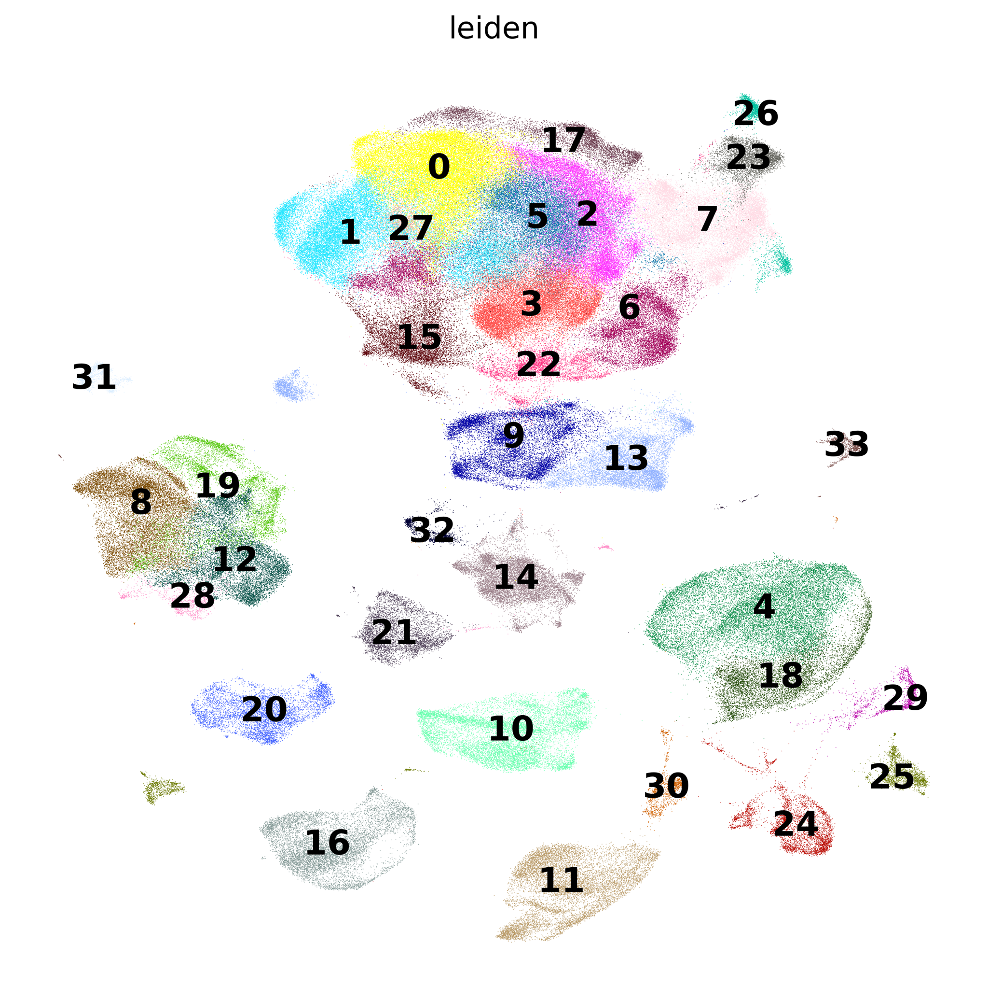

In [8]:
sc.settings.set_figure_params(dpi=200, dpi_save=500, figsize=(8,8), facecolor='white')

sc.pl.umap(
    adata,
    color = ["leiden"],
    legend_loc='on data', 
    legend_fontsize=16, 
    frameon = False,
    save = '_leiden.pdf'
)

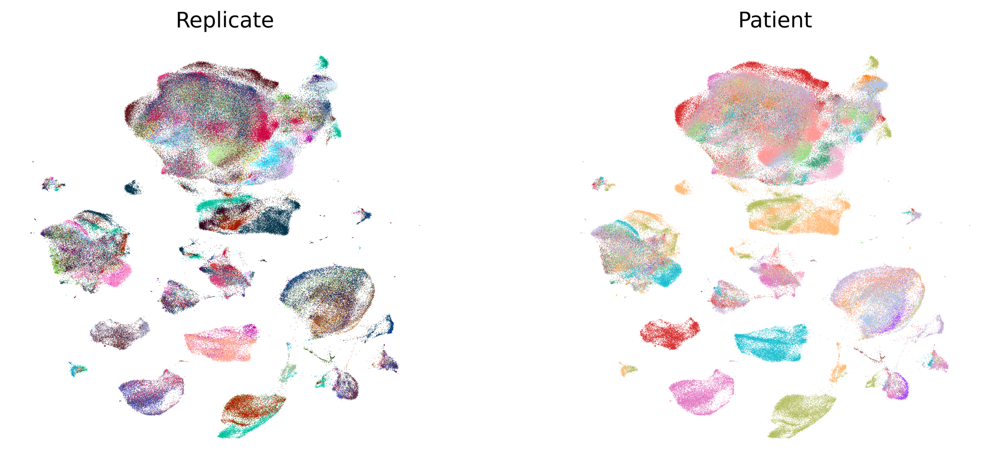

In [19]:
sc.settings.set_figure_params(dpi=300, dpi_save=500, figsize=(5,5), facecolor='white')

sc.pl.umap(
    adata,
    color = ["Replicate", "Patient"],
    legend_loc='none', 
    legend_fontsize=8, 
    frameon = False
)

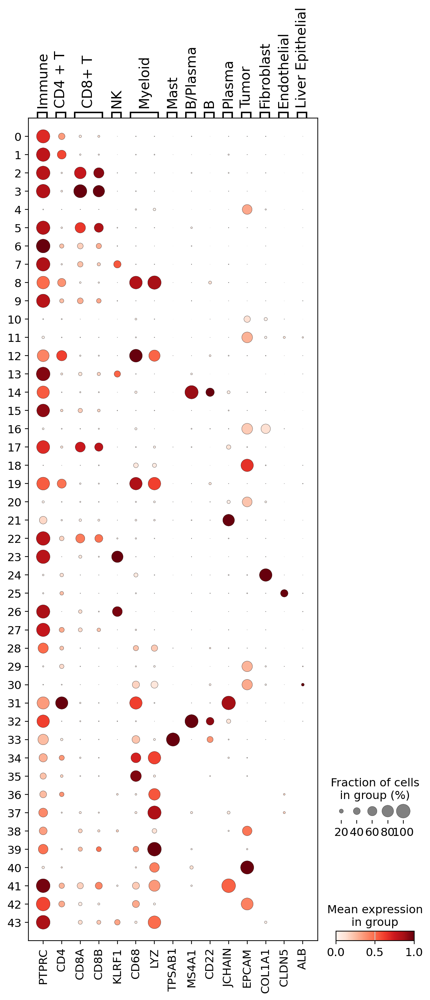

In [20]:

sc.settings.set_figure_params(dpi=100, dpi_save=300, figsize=(15,5), facecolor='white')

marker_dict = {
    'Immune': ['PTPRC'],
    'CD4 + T': ['CD4'],
    'CD8+ T': ['CD8A', 'CD8B'],
    'NK': ['KLRF1'],
    'Myeloid': ['CD68', 'LYZ'],
    'Mast': ['TPSAB1'],
    'B/Plasma': ['MS4A1'],
    'B': ['CD22'],
    'Plasma': ['JCHAIN'],
    'Tumor': ['EPCAM'],
    'Fibroblast': ['COL1A1'],
    'Endothelial': ['CLDN5'],
    'Liver Epithelial': ['ALB']
}


sc.pl.dotplot(
    adata, marker_dict, 'leiden',
    standard_scale='var', swap_axes=False,
    save = 'markers.pdf'
)

#sc.pl.dotplot(adata, marker_dict, groupby='leiden', figsize=(12,6), standard_scale='var',  dendrogram=True, save='markers.pdf')

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

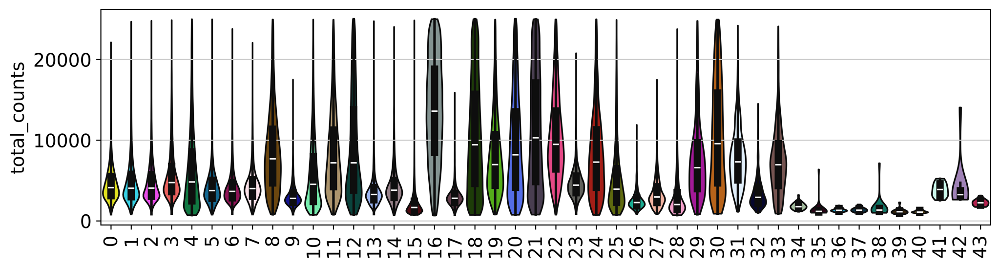

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

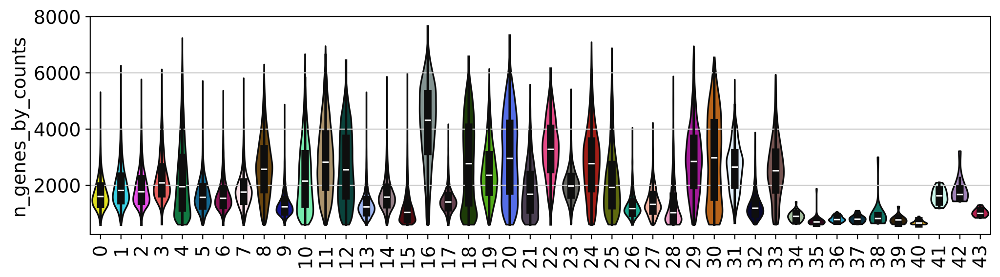

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

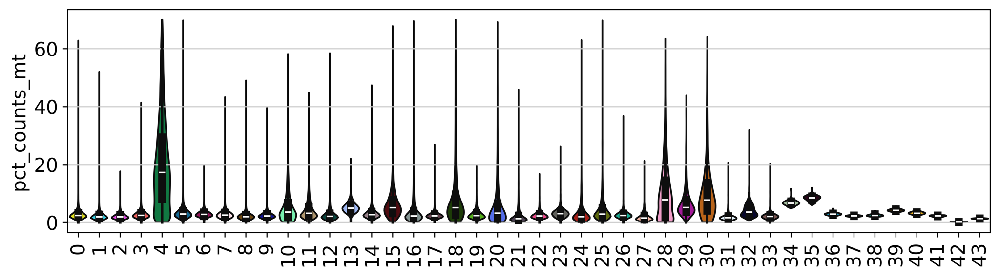

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

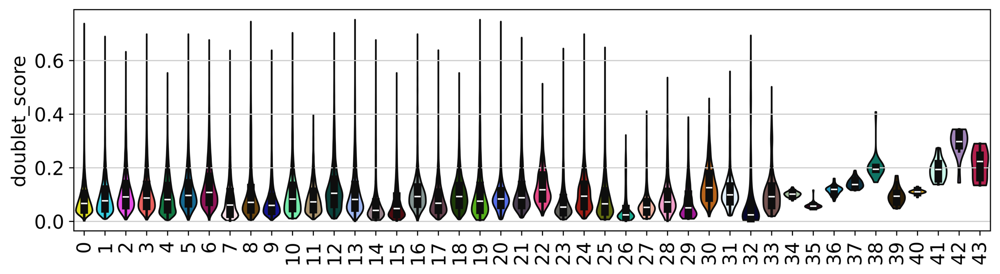

In [21]:
sc.settings.set_figure_params(dpi=400, dpi_save=400, figsize=(10,3), facecolor='white')
sc.pl.violin(adata,[ 'total_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=90)
sc.pl.violin(adata,[ 'n_genes_by_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=90)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=90)
sc.pl.violin(adata,[ 'doublet_score'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=90)

In [55]:
adata.obs.leiden.value_counts()

leiden
0     24731
1     21252
2     17643
3     16190
4     16081
5     14564
6     14224
7     13703
8     12631
9     11695
10    10852
11    10307
12    10196
13     9997
14     9985
15     8956
16     8838
17     7358
18     7216
19     6134
20     6030
21     4875
22     4801
23     4459
24     4249
25     3106
26     2358
27     1949
28     1547
29     1402
30     1400
31     1342
32     1222
33      990
34       37
35       34
36       30
37       23
38       21
39       19
40       19
41       17
42       12
43       10
Name: count, dtype: int64

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


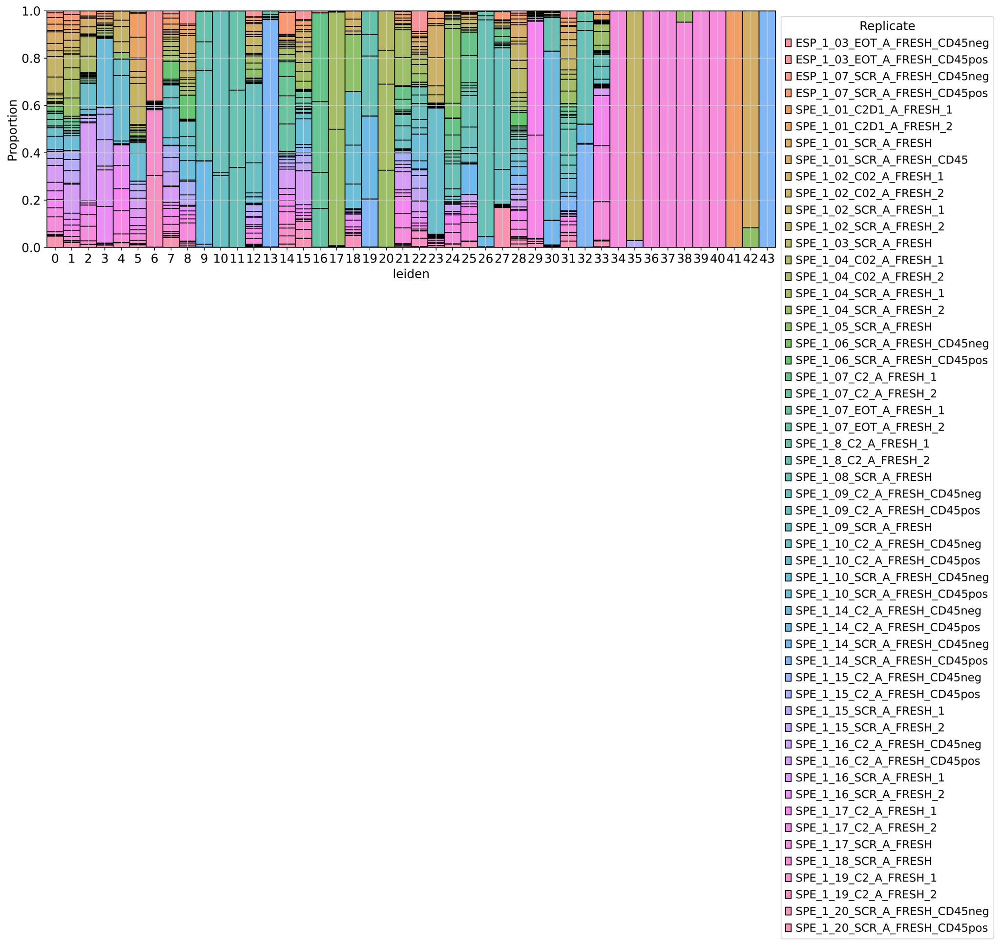

In [56]:
# stacked bar chart
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(15,5), facecolor='white')
ax = sns.histplot(
    data = adata.obs,
    x = 'leiden',
    hue = 'Replicate',
    multiple='fill', stat='proportion',
    discrete=True
)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


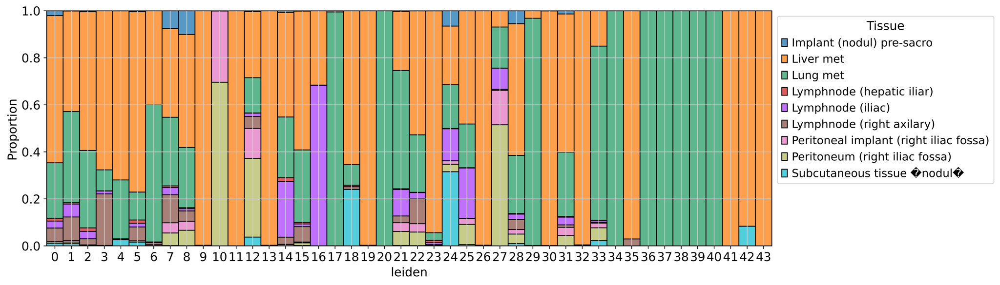

In [57]:
# stacked bar chart
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(15,5), facecolor='white')
ax = sns.histplot(
    data = adata.obs,
    x = 'leiden',
    hue = 'Tissue',
    multiple='fill', stat='proportion',
    discrete=True
)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

## Run CellTypist for 5 models

In [35]:
model_files ={
    'AIFI_L1': '/home/groups/singlecell/smorabito/analysis/SERPENTINE/reference_data/AIFI/data/ref_pbmc_clean_celltypist_model_AIFI_L1_2024-04-18.pkl',
    'AIFI_L2': '/home/groups/singlecell/smorabito/analysis/SERPENTINE/reference_data/AIFI/data/ref_pbmc_clean_celltypist_model_AIFI_L2_2024-04-19.pkl',
    'AIFI_L3': '/home/groups/singlecell/smorabito/analysis/SERPENTINE/reference_data/AIFI/data/ref_pbmc_clean_celltypist_model_AIFI_L3_2024-04-19.pkl',
    'Immune_All_Low': '/home/groups/singlecell/smorabito/analysis/SERPENTINE/reference_data/Conde2022/data/Immune_All_Low.pkl',
    'Immune_All_High': '/home/groups/singlecell/smorabito/analysis/SERPENTINE/reference_data/Conde2022/data/Immune_All_High.pkl'
}

In [36]:
label_results = {}
prob_results = {}
for model_name, model in model_files.items():
    print(model_name)
    label_column = f'{model_name}_prediction'
    score_column = f'{model_name}_score'
    
    predictions = celltypist.annotate(
        filename = adata, 
        model = model
    )
    
    labels = predictions.predicted_labels
    labels = labels.rename({'predicted_labels': label_column}, axis = 1)
    
    prob = predictions.probability_matrix
    labels[score_column] = prob.max(axis='columns').to_list()
    label_results[model_name] = labels

    # add predicted probabilities to the adata.obsm
    adata.obsm[model_name] = prob

⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 292505 cells and 36601 genes
🔗 Matching reference genes in the model


AIFI_L1


🧬 1099 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 292505 cells and 36601 genes
🔗 Matching reference genes in the model


AIFI_L2


🧬 1916 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 292505 cells and 36601 genes
🔗 Matching reference genes in the model


AIFI_L3


🧬 2483 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 292505 cells and 36601 genes
🔗 Matching reference genes in the model


Immune_All_Low


🧬 6147 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 292505 cells and 36601 genes
🔗 Matching reference genes in the model


Immune_All_High


🧬 6147 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


In [37]:
# add the labels & label scores to the obs 
for model_name, label_df in label_results.items():    
    label_column = f'{model_name}_prediction'
    score_column = f'{model_name}_score'

    adata.obs[label_column] = label_df[label_column]
    adata.obs[score_column] = label_df[score_column]

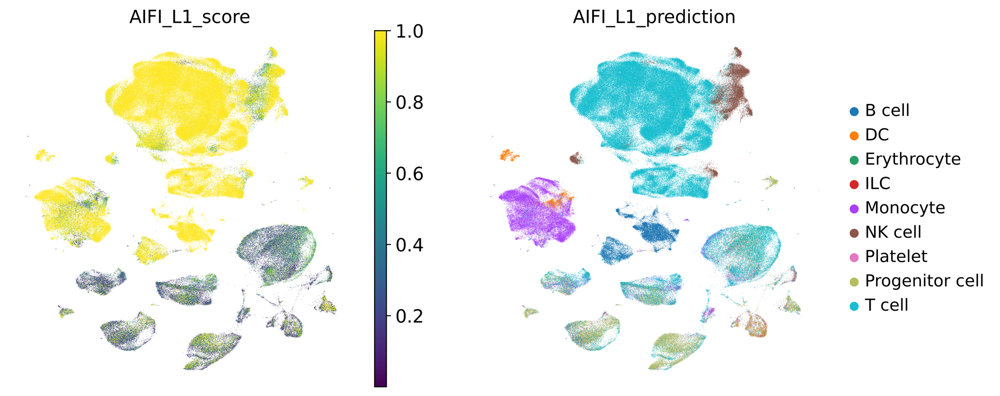

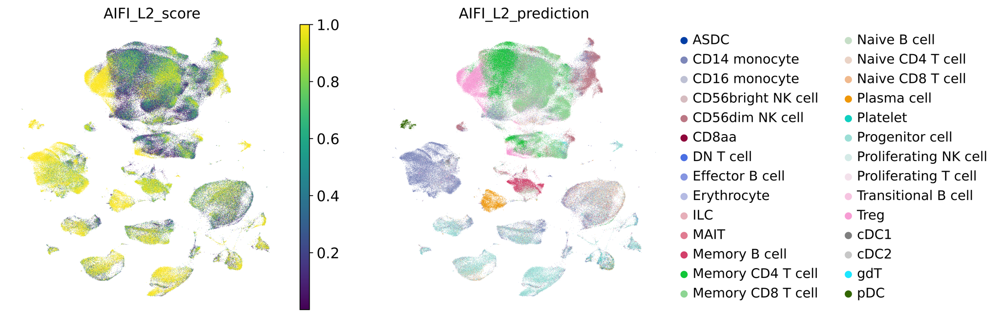

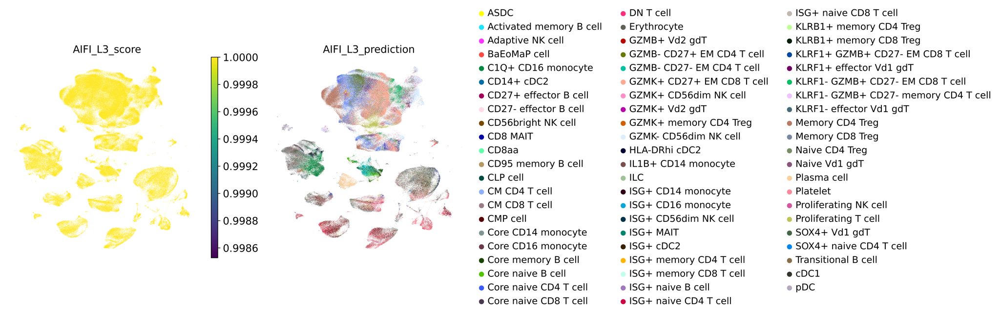

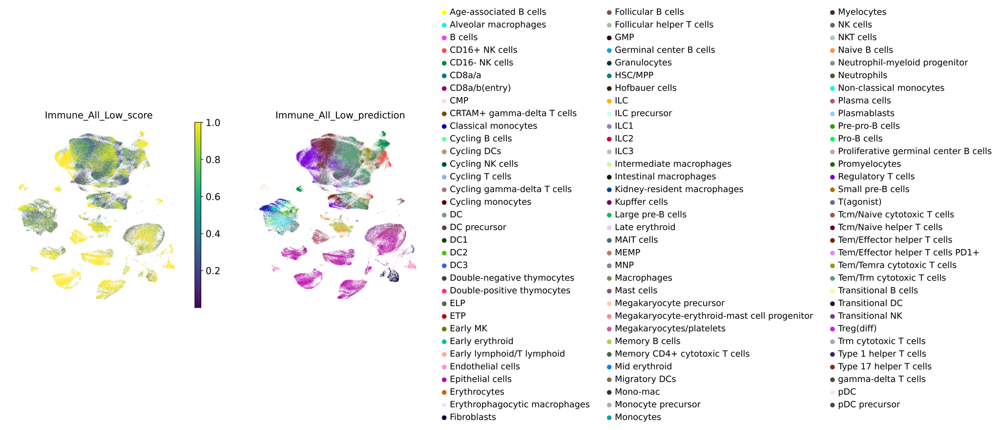

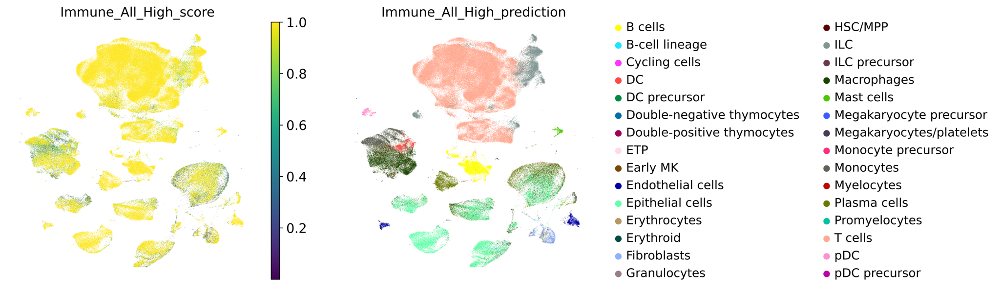

In [38]:
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(5,5), facecolor='white')
for model_name in label_results.keys():    
    label_column = f'{model_name}_prediction'
    score_column = f'{model_name}_score'
    
    sc.pl.umap(
        adata,
        color = [score_column, label_column],
        frameon = False
    )

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


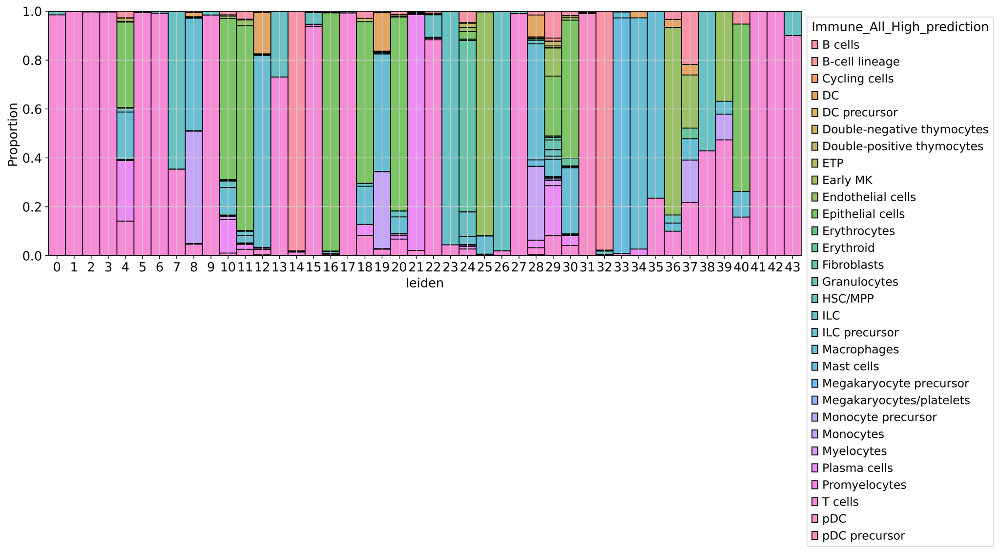

In [39]:
# stacked bar chart
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(15,5), facecolor='white')
ax = sns.histplot(
    data = adata.obs,
    x = 'leiden',
    hue = 'Immune_All_High_prediction',
    multiple='fill', stat='proportion',
    discrete=True
)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

In [40]:
# Majority Voting

group_by = "leiden"
prediction_name = "Immune_All_High"

score_thresh = 0.75

cluster_labels = adata.obs[group_by]
clusters = cluster_labels.unique().to_list()
predictions = adata.obsm[prediction_name].copy()

# add a cluster column 
predictions['cluster'] = cluster_labels

# calculate average predictions for each cluster 
avg_predictions = predictions.groupby('cluster').mean()

# get the max avg predicted for each cluster 
max_scores = avg_predictions.max(axis='columns').to_list()
max_labels = avg_predictions.idxmax(axis='columns').to_list()

max_labels = [max_labels[i] if max_scores[i] > score_thresh else 'Mixed' for i in range(0, len(max_labels))]


max_labels

['T cells',
 'T cells',
 'T cells',
 'T cells',
 'Mixed',
 'T cells',
 'T cells',
 'Mixed',
 'Mixed',
 'T cells',
 'Epithelial cells',
 'Epithelial cells',
 'Mixed',
 'Mixed',
 'B cells',
 'T cells',
 'Epithelial cells',
 'T cells',
 'Mixed',
 'Mixed',
 'Mixed',
 'Plasma cells',
 'T cells',
 'ILC',
 'Mixed',
 'Endothelial cells',
 'ILC',
 'T cells',
 'Mixed',
 'Mixed',
 'Mixed',
 'pDC',
 'B cells',
 'Mast cells',
 'Macrophages',
 'Macrophages',
 'Mixed',
 'Mixed',
 'Mixed',
 'Mixed',
 'Mixed',
 'T cells',
 'T cells',
 'Mixed']

AIFI_L1


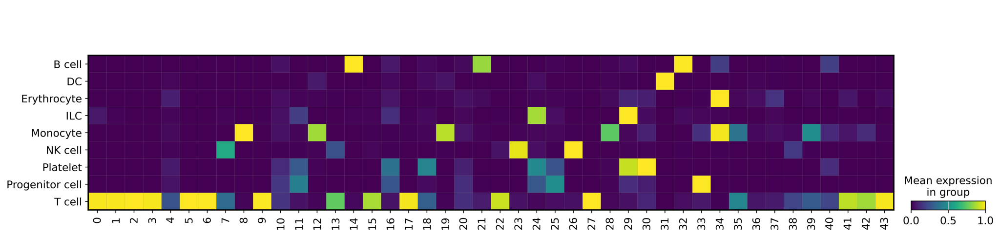

AIFI_L2


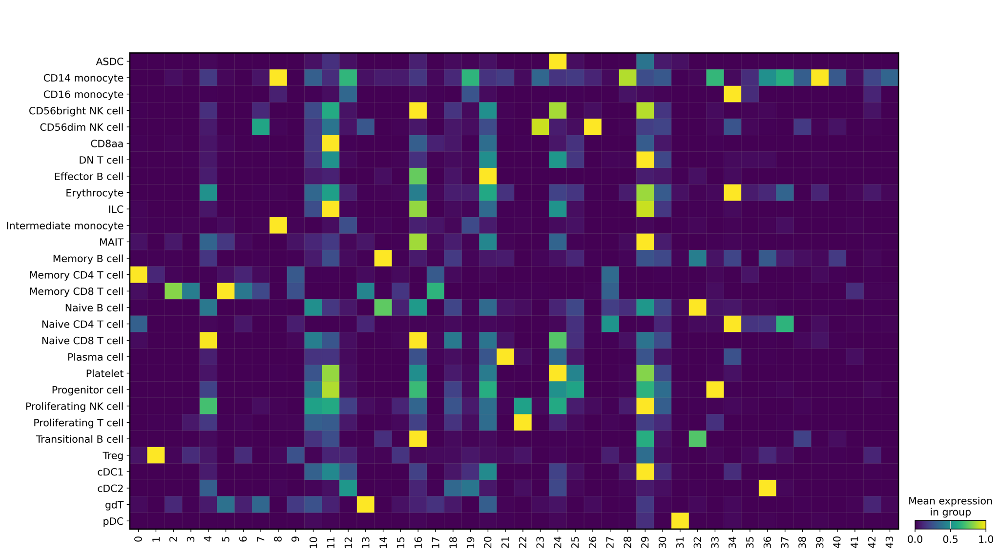

AIFI_L3


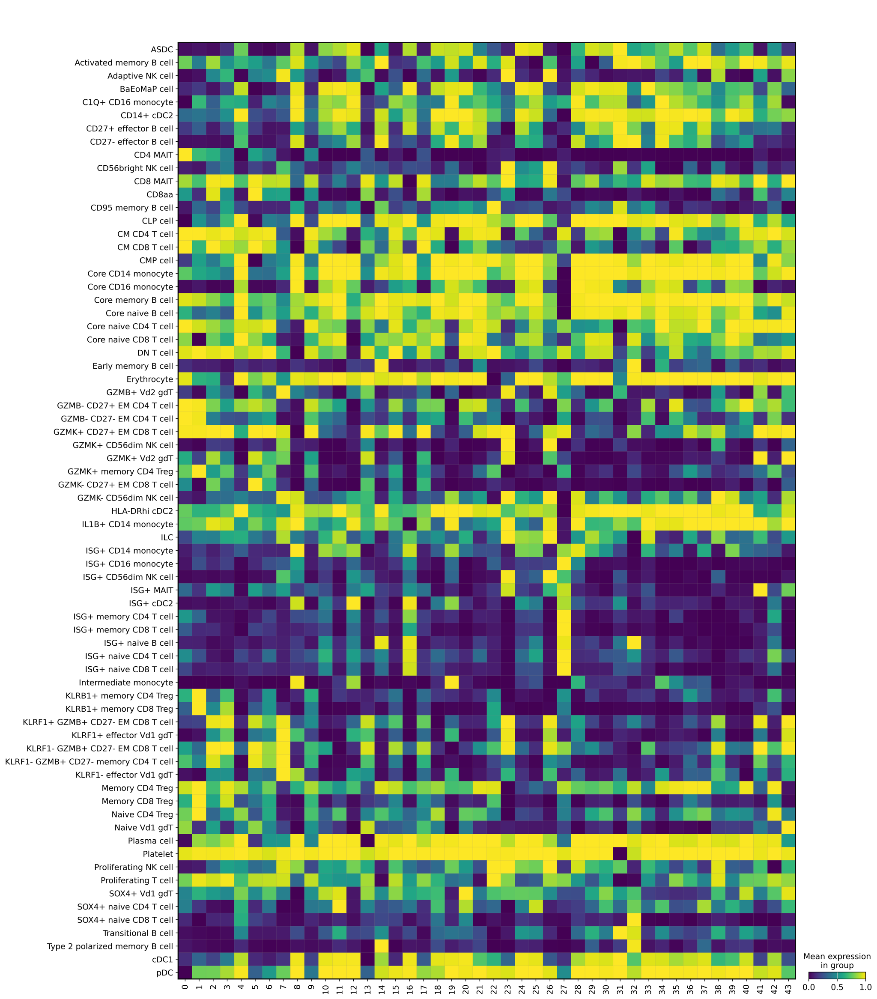

Immune_All_Low


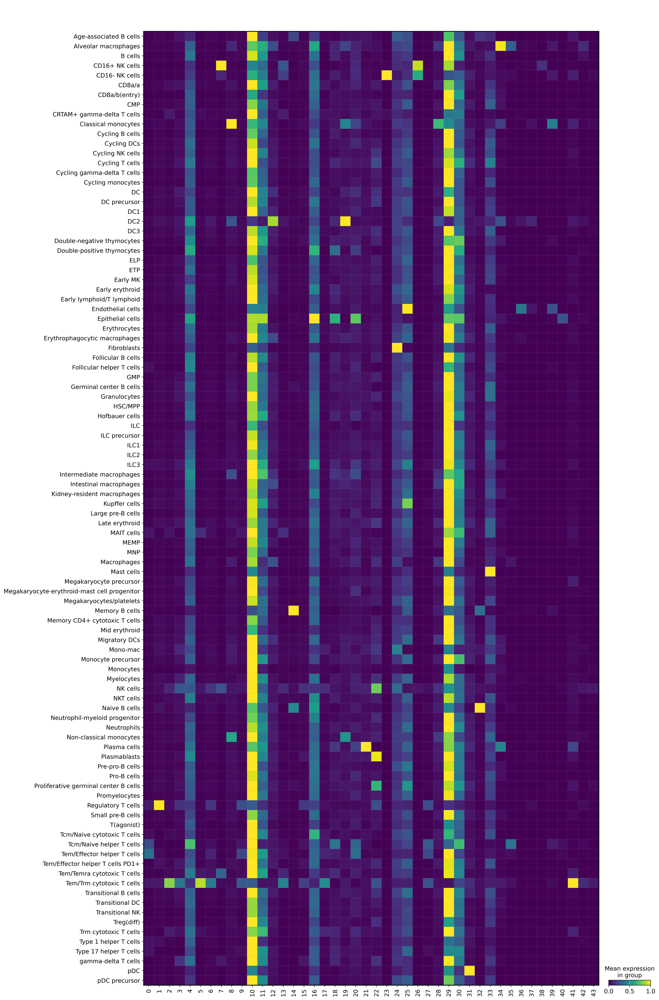

Immune_All_High


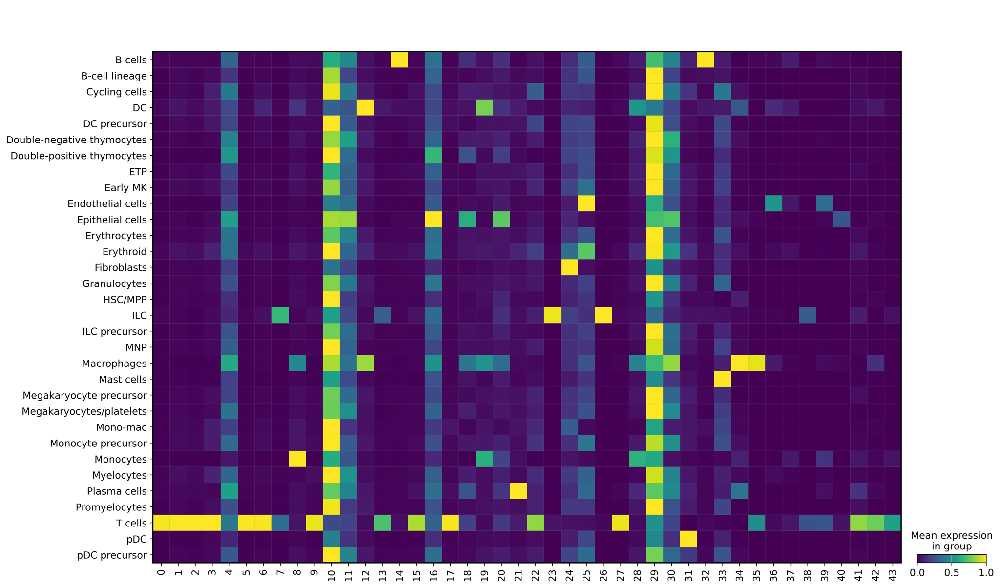

In [54]:
sc.settings.set_figure_params(dpi=250, dpi_save=300, figsize=(10,5), facecolor='white')

for model_name in model_files.keys():

    print(model_name)
    old_obs = adata.obs.copy()
    
    # add the predicted probs
    probs = adata.obsm[model_name] 
    feats = probs.columns.to_list()
    new_obs = pd.concat([adata.obs, probs], axis=1)
    adata.obs = new_obs 
    
    sc.pl.matrixplot(
        adata, var_names=feats, groupby='leiden',
        standard_scale='var', swap_axes=True,
        save = '{}_predicted_labels.pdf'.format(model_name)
    )
    
    # reset the obs
    adata.obs = old_obs


## 

## Annotate the clusters

In [ ]:
# remove the cell type & annotation columns
# adata.obs = adata.obs.drop(['cell_type', 'annotation'], axis=1)

In [9]:
leiden_df = pd.read_table(
    "{}SERPENTINE_leiden_annotations_initial.txt".format(data_dir), sep='\t',
)
leiden_df.leiden = leiden_df.leiden.astype(str).astype('category')

In [10]:
# merge with anndata obs
temp = adata.obs.merge(leiden_df, how='left', on='leiden')

In [11]:

adata.obs['cell_type'] = temp.cell_type.to_list() 
adata.obs['annotation'] = temp.annotation.to_list()

... storing 'cell_type' as categorical
... storing 'annotation' as categorical


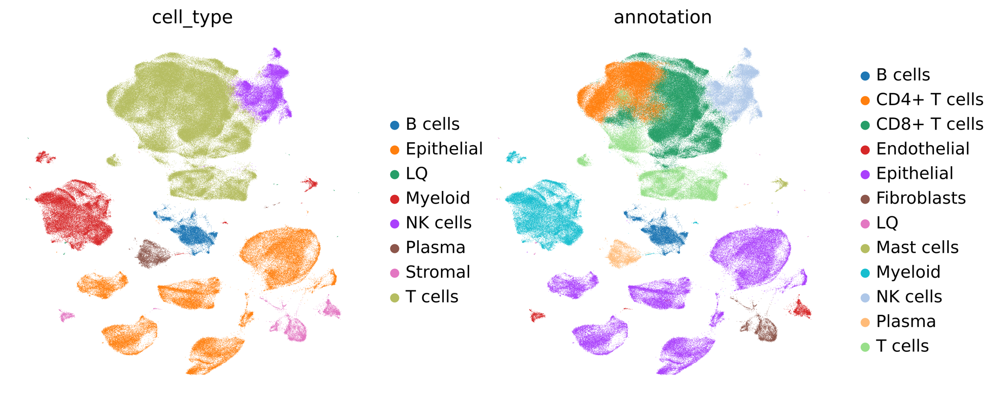

In [12]:
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(5,5), facecolor='white')

sc.pl.umap(
    adata,
    color = ['cell_type', 'annotation'],
    frameon = False,
    save = '_initial_annotation.pdf'

)

## Remove low quality (LQ) clusters

In [18]:
adata = adata[~adata.obs.cell_type.isin(['LQ'])].copy()

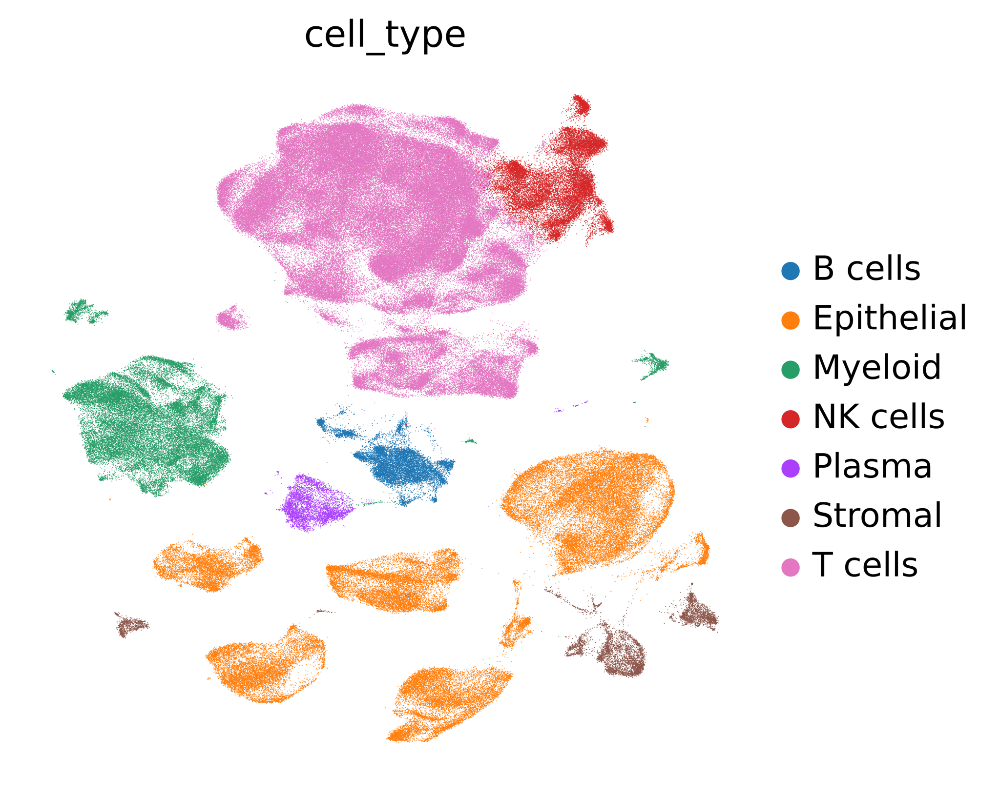

In [20]:
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(5,5), facecolor='white')

sc.pl.umap(
    adata,
    color = ['cell_type'],
    frameon = False,
    save = '_initial_annotation.pdf'

)

## Write the results with the annotations

In [21]:
# save the results
adata.write('{}SERPENTINE_PCA_27-11-24_annotated.h5ad'.format(data_dir))

In [22]:
print('done')

done
